Отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое:
⎢ A man is crossing a mountain pass on a metal bridge.
Сервис выводит несколько фотографий с такой же или похожей сценой.

Необходимо разработать демонстрационную версию поиска изображений по запросу.

In [1]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 48.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 115.6 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import random
import warnings
warnings.filterwarnings('ignore')
import nltk
import re
import string
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from collections import Counter
import os
from os.path import exists, isfile, join

import tensorflow as tf
from IPython.display import display
from ipywidgets import IntProgress
from matplotlib import pyplot as plt
from PIL import Image
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import notebook
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.applications.resnet import (
                                                  ResNet50,
                                                  decode_predictions,
                                                  preprocess_input,
                                                  )
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm.notebook import tqdm, trange
from transformers import TFAutoModel, AutoTokenizer
from tensorflow.keras.models import Model

In [3]:
np.random.seed(12345)
tf.random.set_seed(12345)
pd.options.display.float_format = '{:.2f}'.format

nltk.download('averaged_perceptron_tagger')
nltk.download("stopwords") # поддерживает удаление стоп-слов
nltk.download('punkt') # делит текст на список предложений
nltk.download('wordnet') # проводит лемматизацию

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

# Знакомство с данными

## Данные по описанию изображений

In [4]:
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip

DATA_PATH = '/content/to_upload'

In [5]:
train_dataset = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))
train_dataset.head(10)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [6]:
train_dataset.describe()

,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


Как мы можем наблюдать в тренировочном датасете мы имеем 1000 изображений с 5822 связями с описаниями. Из них 977 уникальны. Далее ознакомимся с изображениями.

## Данные изображений

In [7]:
datagen = ImageDataGenerator(rescale=1./255)
datagen_gen_flow = datagen.flow_from_dataframe(
        dataframe=train_dataset,
        directory = os.path.join(DATA_PATH, 'train_images'),
        x_col='image',
        y_col='query_text',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=12345)

Found 5822 validated image filenames.


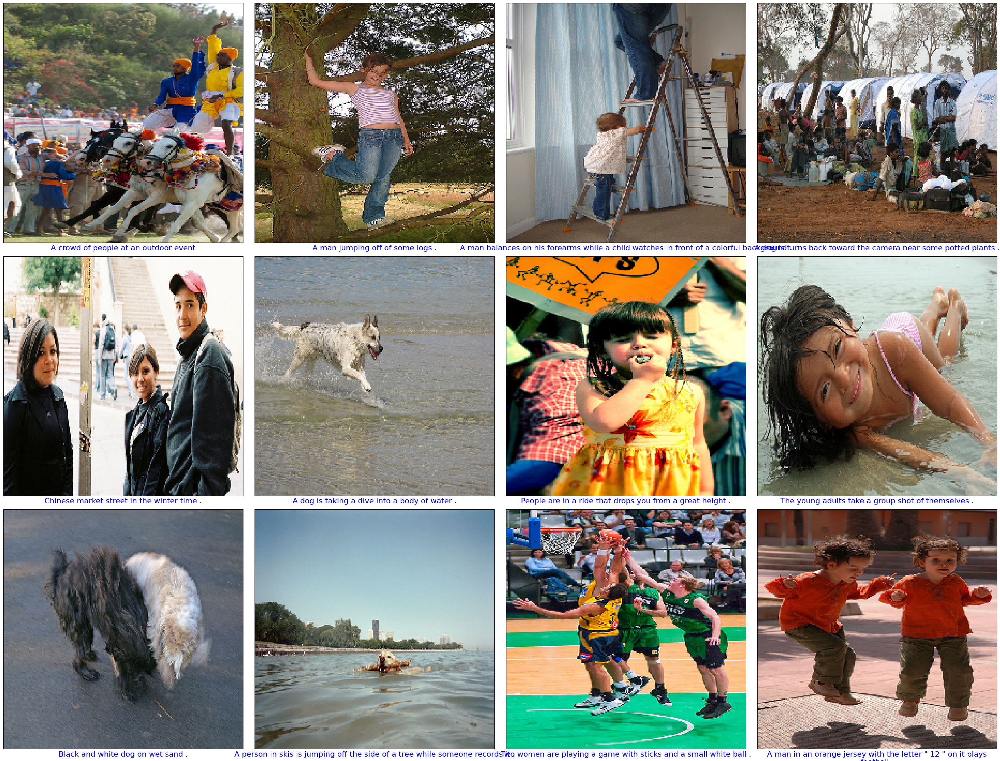

In [8]:
features, target = next(datagen_gen_flow)

fig = plt.figure(figsize=(30,30))
for i in range(12):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.xlabel(target[i], fontsize=16, color = 'blue', loc = 'center', wrap=True)
    plt.yticks([])
    plt.tight_layout()

Видим, что в целом направление изображений совпадает, размер у всех одинаковый. Так же бросается в глаза большое количество детских фотографий, что противоречит юридическим ограничениям и значительно уменьшит выборку.

## Изучение данных краудсорсинга

In [9]:
crowd_annotations = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep="\t", header=None)
crowd_annotations.head(10)

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.00,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.00,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.00,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.00,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.00,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.00,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.00,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.33,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.00,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.00,0,3


In [10]:
crowd_annotations.columns = ['image', 'query_id', 'fraction', 'match', 'unmatch']

In [11]:
crowd_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   fraction  47830 non-null  float64
 3   match     47830 non-null  int64  
 4   unmatch   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [12]:
crowd_annotations.describe()

,fraction,match,unmatch
count,47830.00,47830.00,47830.00
mean,0.07,0.21,2.82
std,0.21,0.63,0.66
min,0.00,0.00,0.00
25%,0.00,0.00,3.00
50%,0.00,0.00,3.00
75%,0.00,0.00,3.00
max,1.00,5.00,6.00


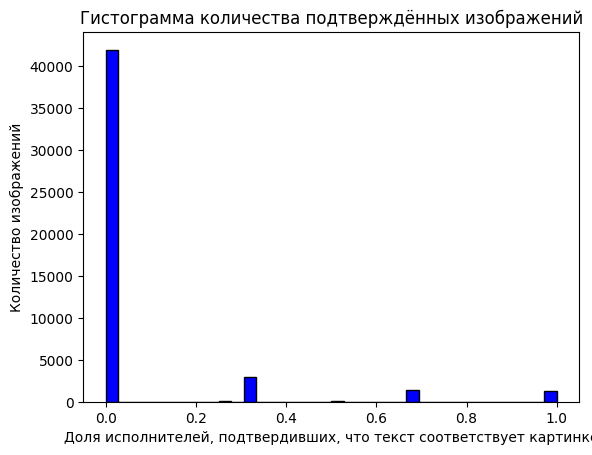

In [13]:
plt.hist(crowd_annotations['fraction'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))
plt.title('Гистограмма количества подтверждённых изображений')
plt.xlabel('Доля исполнителей, подтвердивших, что текст соответствует картинке')
plt.ylabel('Количество изображений')
plt.show()

Исходя из вышеприведённой гистограммы мы можем сделать некоторые выводы.

1. Общее количество изображений равно 47830. Что в корне расходится с количеством изображений в тренировочном датафрейме.

2. Из них доля людей подтвердивших, что изображения соответствуют описанию или хотя бы близки к описанию крайне мала и находится в пределах 5 тысяч.

3. Из вывода №2 можем сделать вывод, что скорее всего изображения, которые находятся в диапазоне от 0.6 до 1, попали в тренировочный датасет, поскольку имеют одинаковое с ним количество. 

Для дальнейших выводов проверим данные экспертных оценок. Однако, сначала проверим гипотезу вывода №3.

In [14]:
crowd_annotations['fraction'].value_counts()

0.00    41970
0.33     3000
0.67     1360
1.00     1323
0.25       96
0.50       27
0.20       22
0.75        9
0.60        8
0.40        8
0.80        4
0.17        3
Name: fraction, dtype: int64

In [15]:
crowd_annotations['fraction'][crowd_annotations['fraction']>0.2].count()

5835

Как мы можем наблюдать в выводе №3 мы совершили ошибку в диапазоне. При более детальном осмотре данных оказалось, что диапазон идет от 0,2 до 1. Но если сравнивать с количеством на тренировочном датасете, то здесь мы наблюдаем, что количество изображений несколько выше, чем на трейне. Будем иметь это в виду при изучении экспертных оценок.

## Данные экспертных оценок

In [16]:
expert_annotations = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep="\t", header=None)
expert_annotations.head(10)

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


In [17]:
expert_annotations.columns = ['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']

In [18]:
expert_annotations.describe()

,expert_1,expert_2,expert_3
count,5822.00,5822.00,5822.00
mean,1.44,1.62,1.88
std,0.79,0.86,0.90
min,1.00,1.00,1.00
25%,1.00,1.00,1.00
50%,1.00,1.00,2.00
75%,2.00,2.00,2.00
max,4.00,4.00,4.00


Непосредственно по данным мы видим, что два эксперта из трёх считают, что половина всех имеющихся фотографий не соответсвуют описанию, и лишь один эксперт считает, что половина изображений имеют хотя бы элементы из описания. Из этого можем сделать вывод, что качество описания изображений неудовлетворительное, что несомненно повлияет на результаты моделирования не в лучшую сторону, отчего наша задача усложняется. Однако мы можем обогатить наш тренировочный фрейм за счет данных краудсорсинга.

 ## Данные тестовой выборки

In [19]:
test_dataset = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), sep="|", index_col=0)
test_dataset.head(10)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg


In [20]:
test_dataset.describe()

,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
freq,1,1,5


В тестовом наборе 100 изображений с 500 уникальными описаниями. Получается каждому изображению соответсвует пять уникальных описаний.

In [21]:
test_img = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'))
test_img.head(10)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg
5,424307754_1e2f44d265.jpg
6,3044359043_627488ddf0.jpg
7,3396275223_ee080df8b5.jpg
8,2977379863_2e8d7a104e.jpg
9,634891010_9fa189effb.jpg


In [22]:
test_gen_flow = datagen.flow_from_dataframe(
        dataframe=test_dataset,
        directory=os.path.join(DATA_PATH, 'test_images'),
        x_col='image',
        y_col='query_text',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=12345)

Found 500 validated image filenames.


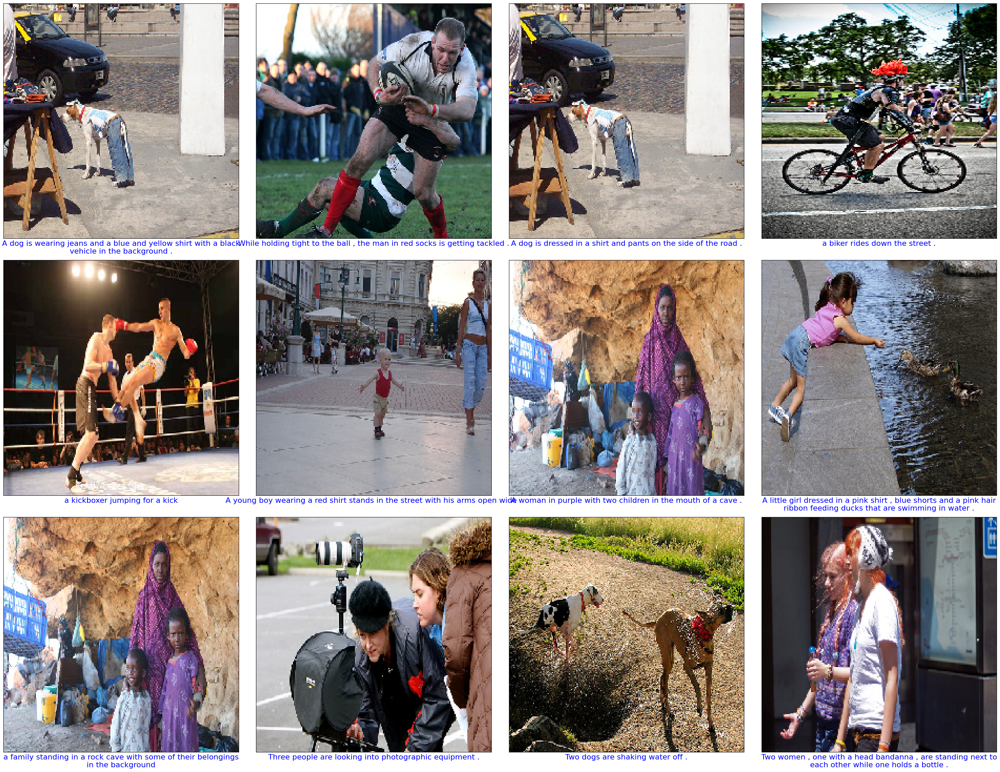

In [23]:
features_test, target_test = next(test_gen_flow)

fig = plt.figure(figsize=(30,30))
for i in range(12):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features_test[i])
    plt.xticks([])
    plt.xlabel(target_test[i], fontsize=16, color = 'blue', loc = 'center', wrap=True)
    plt.yticks([])
    plt.tight_layout()

## Вывод

1. Загрузили тренировочную выборку из 5822 пар изображение-описание и ознакомились со структурой.
2. Загрузили тестовую выборку и ознакомились с ее структурой.(100 изображений с 5 уникальными описаниями каждое)
3. Данные краудсорсинга не подходят для вывода единой оценки.
4. Набор оценок экспертов содержит неудовлетворительные оценки о разметке описаний изображений. Однако будет использован для вывода единой оценки, поскольку является фильтрацией данных краудсорсинга.
5. Изображения в тренировочном и тестовом датасете приведены к одному размеру и имеют одинаковое направление.


# Подготовка данных к моделированию

Прежде чем приступим к моделированию нам необходимо провести ряд операций.

1. Выявить единую оценку соответствия изображений описаниям и отфильтровать их.
2. Обогатить данные тренировочной выборки после фильтрации
3. Лемматизировать описания изображений
4. Выявить юридически неправомерный контент и удалить его из обучающей выборки
5. Закодировать описания изображений
6. Закодировать изображения

## Единая экспертная оценка

Единая оценка будет выведена из оценок 3 экспертов по демократичному методу голосования большинством

In [24]:
# функция принимает на вход оценки от экспертов и возвращает ту, которая совпадает хотя бы у двоих экспертов, иначе возвращает None
def vote(exp_1, exp_2, exp_3):
    if exp_1 == exp_2 or exp_1 == exp_3:
        return exp_1
    elif exp_2 == exp_3:
        return exp_2
    else:
        return None

In [25]:
expert_annotations["estimate"] = expert_annotations.apply(lambda x: vote(x['expert_1'], x['expert_2'], x['expert_3']), axis=1)

In [26]:
expert_annotations.dropna(subset=["estimate"], inplace=True)

In [27]:
expert_annotations.head(10)

,image,query_id,expert_1,expert_2,expert_3,estimate
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.00
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.00
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1,1.00
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1,1.00
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2,1.00
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1,1.00
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2,2.00


Частично задача решена. Далее проведём фильтрацию. Мы отмасштабируем столбец простым линейным преобразованием (x -1) /3 и удалим все что меньше 0.5.

In [28]:
def lin(x):
  x=(x-1)/3
  return x

In [29]:
expert_annotations["estimate"] = expert_annotations.apply(lambda x: lin(x['estimate']), axis = 1)

In [30]:
expert_annotations.head()

,image,query_id,expert_1,expert_2,expert_3,estimate
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.00
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.00
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.00
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.33
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.00


In [31]:
expert_annotations = expert_annotations.drop(expert_annotations[expert_annotations["estimate"] < 0.5].index, axis=0)

In [32]:
expert_annotations.shape

(803, 6)

In [33]:
expert_annotations = expert_annotations.reset_index(drop = True)

In [34]:
expert_annotations.head(10)

,image,query_id,expert_1,expert_2,expert_3,estimate
0,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,2,3,3,0.67
1,1107246521_d16a476380.jpg,2410320522_d967f0b75c.jpg#2,2,3,3,0.67
2,1107246521_d16a476380.jpg,3582742297_1daa29968e.jpg#2,3,3,3,0.67
3,1119015538_e8e796281e.jpg,229862312_1a0ba19dab.jpg#2,3,3,3,0.67
4,1119015538_e8e796281e.jpg,348380010_33bb0599ef.jpg#2,2,3,3,0.67
5,1119015538_e8e796281e.jpg,387830531_e89c192b92.jpg#2,2,3,3,0.67
6,1119015538_e8e796281e.jpg,416106657_cab2a107a5.jpg#2,4,4,4,1.00
7,1131800850_89c7ffd477.jpg,2345984157_724823b1e4.jpg#2,3,4,4,1.00
8,1131932671_c8d17751b3.jpg,1131932671_c8d17751b3.jpg#2,4,4,4,1.00
9,1131932671_c8d17751b3.jpg,3245460937_2710a82709.jpg#2,3,3,3,0.67


Далее отфильтруем тренировочный датафрейм.

In [35]:
expert_annotations = expert_annotations.drop(['expert_1', 'expert_2', 'expert_3'], axis = 1)

In [36]:
train_dataset_est = (
                train_dataset.set_index(["image", "query_id"])
                .join(
                      expert_annotations.set_index(["image", "query_id"])[["estimate"]],
                      how="inner",
                     )
                .reset_index()
                )

In [37]:
train_dataset_est.head(10)

,image,query_id,query_text,estimate
0,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.00
1,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1.00
2,700884207_d3ec546494.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.67
3,2370481277_a3085614c9.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.67
4,2913965136_2d00136697.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.67
5,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,A white dog jumps to catch a blue ball in a li...,1.00
6,2140182410_8e2a06fbda.jpg,2140182410_8e2a06fbda.jpg#2,The kid is on a float in the snow .,1.00
7,3320032226_63390d74a6.jpg,2140182410_8e2a06fbda.jpg#2,The kid is on a float in the snow .,0.67
8,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,Two long-haired puppy dogs have a romp in the ...,0.67
9,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,Two long-haired puppy dogs have a romp in the ...,0.67


In [38]:
train_dataset_est.shape

(803, 4)

Как мы можем заметить из 5 тысяч осталось 803 изображения. Попробуем увеличить это количество с помощью использования данных краудсорсинга.

## Обогащение данных

Отделяем уникальные id и описания в трейне

In [39]:
train = train_dataset.drop(['image'], axis = 1)
train

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
...,...,...
5817,2061144717_5b3a1864f0.jpg#2,A man in an ampitheater talking to a boy .
5818,2196107384_361d73a170.jpg#2,a old man walks down the uncrowded road .
5819,2112921744_92bf706805.jpg#2,A dog stands on the side of a grassy cliff .
5820,3651971126_309e6a5e22.jpg#2,A blurry photo of two dogs .


In [40]:
train = train.drop_duplicates()
train.head()

,query_id,query_text
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


Создаем колонку image обрезкой двух последних символов

In [41]:
train['image'] = train['query_id'].str.replace(r'#2', '')
train.head()

,query_id,query_text,image
0,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,2549968784_39bfbe44f9.jpg
12,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,2718495608_d8533e3ac5.jpg
22,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,3181701312_70a379ab6e.jpg
27,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,3207358897_bfa61fa3c6.jpg
31,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,3286822339_5535af6b93.jpg


Оценку соответствия ставим равную 1

In [42]:
train['estimate'] = 1.00
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 977 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   query_id    977 non-null    object 
 1   query_text  977 non-null    object 
 2   image       977 non-null    object 
 3   estimate    977 non-null    float64
dtypes: float64(1), object(3)
memory usage: 38.2+ KB


Объединяем с отфильтрованными данными единой экспертной оценки.

In [43]:
train_dataset_est = pd.concat([train_dataset_est, train]).reset_index(drop = True)
train_dataset_est.count()

image         1780
query_id      1780
query_text    1780
estimate      1780
dtype: int64

In [44]:
train_dataset_est = train_dataset_est.drop_duplicates()
train_dataset_est.count()

image         1624
query_id      1624
query_text    1624
estimate      1624
dtype: int64

В результате удалось увеличить отфильтрованный тренировочный датасет на 821 изображение.

## Лемматизация описаний.

In [45]:
# возвращает значение wordnet соответствующее POS tag
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
        
# возвращает значение очищенного текста
def clean_text(text):
    # приводим к нижнему регистру
    text = text.lower()
    # удаляем знаки препинания
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    # удаляем слова содержащие цифры
    text = [word for word in text if not any(c.isdigit() for c in word)]
    # убираем стоп-слова
    stop = stopwords.words('english')
    text = [x for x in text if x not in stop]
    # удаляем пропуски
    text = [t for t in text if len(t) > 0]
    # текс pos tag 
    pos_tags = pos_tag(text)
    # лемматизируем
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    # удаляем слова содержащие только одну букву
    text = [t for t in text if len(t) > 1]
    # джойним результат
    text = " ".join(text)
    return(text)

In [46]:
train_dataset_est["review_clean"] = train_dataset_est['query_text'].apply(lambda x: clean_text(x))# применяем функцию к данным
test_dataset["review_clean"] = test_dataset['query_text'].apply(lambda x: clean_text(x))# применяем функцию к данным

In [47]:
train_dataset_est = train_dataset_est.drop(['query_text'], axis = 1)# дропаем ненужный столбец
test_dataset = test_dataset.drop(['query_text'], axis = 1)# дропаем ненужный столбец

In [48]:
train_dataset_est.head(10)

,image,query_id,estimate,review_clean
0,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,1.00,young child wear blue goggles sit float pool
1,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,1.00,girl wear yellow shirt sunglass smile
2,700884207_d3ec546494.jpg,2718495608_d8533e3ac5.jpg#2,0.67,girl wear yellow shirt sunglass smile
3,2370481277_a3085614c9.jpg,3545652636_0746537307.jpg#2,0.67,young boy dress red uniform kick soccer ball f...
4,2913965136_2d00136697.jpg,3545652636_0746537307.jpg#2,0.67,young boy dress red uniform kick soccer ball f...
5,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,1.00,white dog jump catch blue ball living room
6,2140182410_8e2a06fbda.jpg,2140182410_8e2a06fbda.jpg#2,1.00,kid float snow
7,3320032226_63390d74a6.jpg,2140182410_8e2a06fbda.jpg#2,0.67,kid float snow
8,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow
9,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow


In [49]:
test_dataset.head(10)

,query_id,image,review_clean
0,1177994172_10d143cb8d.jpg#0,1177994172_10d143cb8d.jpg,two blonde boys one camouflage shirt blue wate...
1,1177994172_10d143cb8d.jpg#1,1177994172_10d143cb8d.jpg,two boy squirt water gun
2,1177994172_10d143cb8d.jpg#2,1177994172_10d143cb8d.jpg,two boy spray water
3,1177994172_10d143cb8d.jpg#3,1177994172_10d143cb8d.jpg,two child wear jean squirt water
4,1177994172_10d143cb8d.jpg#4,1177994172_10d143cb8d.jpg,two young boy squirt water
5,1232148178_4f45cc3284.jpg#0,1232148178_4f45cc3284.jpg,baby girl play park
6,1232148178_4f45cc3284.jpg#1,1232148178_4f45cc3284.jpg,closeup child playground adult supervision
7,1232148178_4f45cc3284.jpg#2,1232148178_4f45cc3284.jpg,young boy pose picture front playground
8,1232148178_4f45cc3284.jpg#3,1232148178_4f45cc3284.jpg,young girl smile front camera park
9,1232148178_4f45cc3284.jpg#4,1232148178_4f45cc3284.jpg,little blond hair girl green sweatshirt red sh...


## Фильтрация юридически неправомерного контента

Неправомерный юридический контент подпадает под следующее правило:
поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

In [50]:
# составим список стоп-слов как либо связанных с детьми
on_legal_protection_word = [
                            "boy",
                            "girl",
                            "child",
                            "baby",
                            "kid",
                            "babe",
                            "infant",
                            "teenager",
                            "teeny",
                            "teener",
                            "stripling",
                           ]

In [51]:
# Последовательно ищем слова из стоп-листа on_legal_protection_word в заданном тексте text. Возвращаем True, если нашлось хотя бы одно слово
def child_in_text(text: str) -> bool:
    res = False
    for word in on_legal_protection_word:
        res |= text.lower().find(word) > -1
    return res

In [52]:
train_dataset_est["off_child"] = train_dataset_est.apply(lambda x: child_in_text(x["review_clean"]), axis=1)

In [53]:
non_child = set(train_dataset_est[train_dataset_est["off_child"] == True]["image"])

In [54]:
train_dataset_est = train_dataset_est.drop(train_dataset_est[train_dataset_est["image"].isin(non_child)].index, axis=0)

In [55]:
train_dataset_est.shape

(1182, 5)

In [56]:
train_dataset_est = train_dataset_est.drop(['off_child'], axis = 1)# дропаем ненужный столбец

In [57]:
train_dataset_est.head(10)

,image,query_id,estimate,review_clean
5,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,1.00,white dog jump catch blue ball living room
8,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow
9,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow
10,317383917_d8bfa350b6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow
11,3223224391_be50bf4f43.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow
13,3119076670_64b5340530.jpg,3119076670_64b5340530.jpg#2,1.00,snowboarder air perform stunt
14,3635577874_48ebaac734.jpg,3119076670_64b5340530.jpg#2,0.67,snowboarder air perform stunt
15,2148916767_644ea6a7fa.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow
16,2301525531_edde12d673.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow
17,2340206885_58754a799a.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow


## Векторизация изображений

In [58]:
img_vec = pd.DataFrame(index=train_dataset_est["image"].unique(), columns=["img_vec"]).reset_index()

In [59]:
img_vec.columns = ["image", "img_vec"]

In [60]:
# определяем сеть для векторизации изображений, используем метрику МАЕ
def vector_image_model(input_shape):
    optimizer = Adam(learning_rate=0.0001)
    cnn = ResNet50(input_shape=input_shape, include_top=False, weights="imagenet")

    model = Sequential()
    model.add(cnn)
    model.add(GlobalAveragePooling2D())
    model.compile(loss="mean_absolute_error", optimizer=optimizer, metrics=["mae"])

    return model

In [61]:
vec_model = vector_image_model((224, 224, 3))

94765736/94765736 [==============================] - 0s 0us/step


In [62]:
train_path = os.path.join(DATA_PATH, 'train_images')
test_path = os.path.join(DATA_PATH, 'test_images')

In [63]:
def vector_image(file: str, path: str = train_path):
    img = image.load_img(join(path, file), target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

In [64]:
%%time
# векторизуем изображения
img_vec["img_vec"] = img_vec.apply(lambda x: tf.cast(vec_model(vector_image(x["image"])), dtype=np.float64), axis=1)

CPU times: user 1min 8s, sys: 915 ms, total: 1min 9s
Wall time: 1min 17s


In [65]:
img_vector = img_vec.loc[0, "img_vec"].shape[1]
img_vector

2048

In [66]:
train_dataset_vec = train_dataset_est.merge(img_vec, on="image", how = 'left')

In [67]:
train_dataset_vec.head(10)

,image,query_id,estimate,review_clean,img_vec
0,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,1.00,white dog jump catch blue ball living room,"((tf.Tensor(0.00014514765643980354, shape=(), ..."
1,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.13984441757202148, shape=(), dty..."
2,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.3219275176525116, shape=(), dtyp..."
3,317383917_d8bfa350b6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(1.4164798259735107, shape=(), dtyp..."
4,3223224391_be50bf4f43.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.40125441551208496, shape=(), dty..."
5,3119076670_64b5340530.jpg,3119076670_64b5340530.jpg#2,1.00,snowboarder air perform stunt,"((tf.Tensor(2.0674915313720703, shape=(), dtyp..."
6,3635577874_48ebaac734.jpg,3119076670_64b5340530.jpg#2,0.67,snowboarder air perform stunt,"((tf.Tensor(0.023521604016423225, shape=(), dt..."
7,2148916767_644ea6a7fa.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow,"((tf.Tensor(0.4863508641719818, shape=(), dtyp..."
8,2301525531_edde12d673.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow,"((tf.Tensor(0.05320141091942787, shape=(), dty..."
9,2340206885_58754a799a.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow,"((tf.Tensor(0.3219275176525116, shape=(), dtyp..."


## Векторизация описаний изображений

In [68]:
model_bert = TFAutoModel.from_pretrained("distilbert-base-cased")
tokenizer_bert = AutoTokenizer.from_pretrained("distilbert-base-cased")

Some layers from the model checkpoint at distilbert-base-cased were not used when initializing TFDistilBertModel: ['vocab_layer_norm', 'vocab_transform', 'vocab_projector', 'activation_13']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-cased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


In [69]:
text_vec = pd.DataFrame(index=train_dataset_vec["review_clean"].unique(), columns=["text_vec"]).reset_index()

In [70]:
text_vec.columns = ["review_clean", "text_vec"]

In [71]:
tokenized = text_vec['review_clean'].apply(
    lambda x: tokenizer_bert.encode(x, add_special_tokens=True))

max_len = 0
for i in tokenized.values:
    if len(i) > max_len:
        max_len = len(i)

padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])

attention_mask = np.where(padded != 0, 1, 0)

In [72]:
batch_size = 334
embeddings = []
for i in notebook.tqdm(range(padded.shape[0] // batch_size)):
        batch = tf.convert_to_tensor(padded[batch_size*i:batch_size*(i+1)]) 
        attention_mask_batch = tf.convert_to_tensor(attention_mask[batch_size*i:batch_size*(i+1)])
        
        batch_embeddings = model_bert(batch, attention_mask=attention_mask_batch)
        
        embeddings.append(batch_embeddings[0][:,0,:].numpy())

  0%|          | 0/2 [00:00<?, ?it/s]

In [73]:
featur = np.concatenate(embeddings)

In [74]:
text_vec['text_vec'] = featur.tolist()

In [75]:
text_vec['text_vec'] = text_vec['text_vec'].apply(lambda x: tf.convert_to_tensor([x], dtype=np.float64))

In [76]:
text_vector = text_vec.loc[0, "text_vec"].shape[1]
text_vector

768

In [77]:
train_dataset_vec = train_dataset_vec.merge(text_vec, on="review_clean", how = 'left')
train_dataset_vec.head()

,image,query_id,estimate,review_clean,img_vec,text_vec
0,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,1.00,white dog jump catch blue ball living room,"((tf.Tensor(0.00014514765643980354, shape=(), ...","((tf.Tensor(0.23195575177669525, shape=(), dty..."
1,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.13984441757202148, shape=(), dty...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
2,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.3219275176525116, shape=(), dtyp...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
3,317383917_d8bfa350b6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(1.4164798259735107, shape=(), dtyp...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
4,3223224391_be50bf4f43.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.40125441551208496, shape=(), dty...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."


Далее разобьём трейн на валидационную и тренировочную выборки.

Для разбиения на выборки будем использовать метод GroupShuffleSplit.

In [78]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.75, random_state=12345)
train_indices, valid_indices = next(
                                   gss.split(
                                             X=train_dataset_vec.drop(columns=["query_id"]),
                                             y=train_dataset_vec["query_id"],
                                             groups=train_dataset_vec["image"],
                                            )
                                  )
train_df, valid_df = train_dataset_vec.iloc[train_indices], train_dataset_vec.iloc[valid_indices]

In [79]:
train_df.head()

,image,query_id,estimate,review_clean,img_vec,text_vec
0,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,1.00,white dog jump catch blue ball living room,"((tf.Tensor(0.00014514765643980354, shape=(), ...","((tf.Tensor(0.23195575177669525, shape=(), dty..."
2,2340206885_58754a799a.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.3219275176525116, shape=(), dtyp...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
3,317383917_d8bfa350b6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(1.4164798259735107, shape=(), dtyp...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
4,3223224391_be50bf4f43.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.40125441551208496, shape=(), dty...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
5,3119076670_64b5340530.jpg,3119076670_64b5340530.jpg#2,1.00,snowboarder air perform stunt,"((tf.Tensor(2.0674915313720703, shape=(), dtyp...","((tf.Tensor(0.1571016013622284, shape=(), dtyp..."


In [80]:
valid_df.head()

,image,query_id,estimate,review_clean,img_vec,text_vec
1,1897025969_0c41688fa6.jpg,2398605966_1d0c9e6a20.jpg#2,0.67,two long-haired puppy dog romp snow,"((tf.Tensor(0.13984441757202148, shape=(), dty...","((tf.Tensor(0.3787611722946167, shape=(), dtyp..."
11,2398605966_1d0c9e6a20.jpg,317488612_70ac35493b.jpg#2,0.67,dog run deep snow,"((tf.Tensor(0.6336504220962524, shape=(), dtyp...","((tf.Tensor(0.3269196152687073, shape=(), dtyp..."
12,3197917064_e679a44b8e.jpg,317488612_70ac35493b.jpg#2,1.00,dog run deep snow,"((tf.Tensor(0.18832749128341675, shape=(), dty...","((tf.Tensor(0.3269196152687073, shape=(), dtyp..."
18,3358558292_6ab14193ed.jpg,1536774449_e16b1b6382.jpg#2,0.67,crowd people outdoor event,"((tf.Tensor(0.29774415493011475, shape=(), dty...","((tf.Tensor(0.14639827609062195, shape=(), dty..."
20,3692892751_f6574e2700.jpg,1536774449_e16b1b6382.jpg#2,1.00,crowd people outdoor event,"((tf.Tensor(0.34774598479270935, shape=(), dty...","((tf.Tensor(0.14639827609062195, shape=(), dty..."


## Вывод:

1. Выведена единая экспертная оценка, по результатам которой были отфильтрованы изображения.
2. Данные для тренировки обогащены с помощью данных краудсорса.
3. Лемматизация описаний изображений выполнена.
4. Отфильтрован юридически неправомерный контент.
5. Проведена векторизация изображений
6. Проведена векторизация описаний изображений.
7. Данные разбиты на тренировочную и валидационную выборки.

После всех проведённых операций для моделирования мы имеем 646 изображений.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, готовы данные для обучения моделей.</div>

# Обучение моделей

## Линейная регрессия

Итак обучение начнём с реализации линейной регрессии. Для начала определим фичи и таргет для тренировочного и валидационного датасета.

In [81]:
X_train = train_df[["query_id", "text_vec"]].reset_index(drop = True)
y_train = train_df[["image", "img_vec"]].reset_index(drop = True)

In [82]:
X_val = valid_df[["query_id", "text_vec"]].reset_index(drop = True)
y_val = valid_df[["image", "img_vec"]].reset_index(drop = True)

In [83]:
X = tf.stack(X_train['text_vec'])
Y = tf.stack(y_train['img_vec'])

In [84]:
X_valid = tf.stack(X_val['text_vec'])
y_valid = tf.stack(y_val['img_vec'])

In [85]:
X.shape, Y.shape, X_valid.shape, y_valid.shape

(TensorShape([869, 1, 768]),
 TensorShape([869, 1, 2048]),
 TensorShape([313, 1, 768]),
 TensorShape([313, 1, 2048]))

Фичи и таргеты получены, далее определим веса и смещения линейной регрессии.

In [86]:
W = tf.Variable(np.random.randn(text_vector, img_vector), name="W")
b = tf.Variable(np.random.randn(1, img_vector), name="b")

In [87]:
W.shape, b.shape

(TensorShape([768, 2048]), TensorShape([1, 2048]))

Зададим гиперпараметры

In [88]:
learning_rate = 0.01
epochs = 600
dev_MSE = 1e-3 # для сравнения уменьшения ошибки

In [89]:
def y_pred(x):
    #Задаём линейную зависимость между входом и выходом
    return tf.add(tf.linalg.matmul(x, W), b)


def cost(x=X, y=Y):
    # в качестве метрики используем MSE
    cost = tf.reduce_sum(tf.pow(y_pred(x) - y, 2)) / (2 * img_vector)
    return cost


optimizer = tf.keras.optimizers.Adam(learning_rate)


# Инициализируем веса и смещение
pred = y_pred(X)
lin_param = [W, b]

In [90]:
const = tf.constant(200, np.float64)
for epoch in tqdm(range(epochs)):
  optimizer.minimize(cost, lin_param)
  pred = y_pred(X)
  if (epoch + 1) % 50 == 0:
    c = cost()
    print("Epoch", (epoch + 1), ": MSE =", c.numpy())
    # завершаем обучение, если ошибка перестаёт заметно снижаться
    err = (const - c) / c
    if abs(err) < dev_MSE:
      print(f"MSE_last: {err}")
      break

  0%|          | 0/600 [00:00<?, ?it/s]

Epoch 50 : MSE = 2008.8828205412665
Epoch 100 : MSE = 1284.7605490038663
Epoch 150 : MSE = 1009.5944351010685
Epoch 200 : MSE = 844.6974707812072
Epoch 250 : MSE = 734.2301700188499
Epoch 300 : MSE = 654.7125671529473
Epoch 350 : MSE = 594.4740225338095
Epoch 400 : MSE = 547.053649213553
Epoch 450 : MSE = 508.59028269993803
Epoch 500 : MSE = 476.64153201959624
Epoch 550 : MSE = 449.5904172821696
Epoch 600 : MSE = 426.3243137397849


Линейная регрессия обучена. Далее подберем изображения максимально близкие к запросам. Для этого нужно вычислить расстояние между двумя векторами. После этого выберем наиболее близкие вектора.

In [91]:
def distance_of_vectors(pred: tf.Tensor, target: tf.Tensor, ord: str = "euclidean") -> float:
    # вычисляем евклидово расстояние векторов
    return tf.norm(target - pred, axis=-1, ord=ord).numpy()[0]

In [92]:
def find_images(query_vec, ind_vec, lim=3):
    # ищем в заданной серии ind_vec векторов, наиболее близких к запросу query_vec.
    iv = y_pred(query_vec)
    df = ind_vec.copy()
    for i in df.index:
        df.loc[i, "distance"] = distance_of_vectors(iv, df.loc[i, "img_vec"])
    return df.sort_values(by="distance")["image"].unique()[:lim]

In [93]:
def show_images(query, images, path=train_path, rows=1, columns=3):
    # выводит фото из списка images, соответсвующие запросу query
    fig = plt.figure(figsize=(12, 12))
    print(query)
    count = 1
    for file in images:
        img = Image.open(join(path, file))
        fig.add_subplot(rows, columns, count)
        count += 1
        plt.imshow(np.array(img))
        plt.axis("off")

In [94]:
def predict_end(idx):
    # принимает индекс в валидационной выборке, извлекает из неё запрос, его вектор, строит прогноз и выводит результат
    qv = X_val.loc[idx, "text_vec"]
    qt = valid_df[valid_df["query_id"] == X_val.loc[idx, "query_id"]]["review_clean"].iloc[0]
    images = find_images(qv, y_val)
    show_images(qt, images)

dog run deep snow


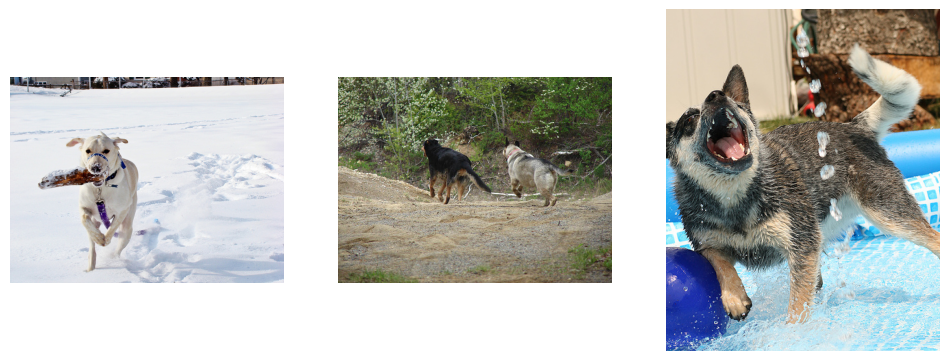

In [95]:
predict_end(1)

dog roll grass


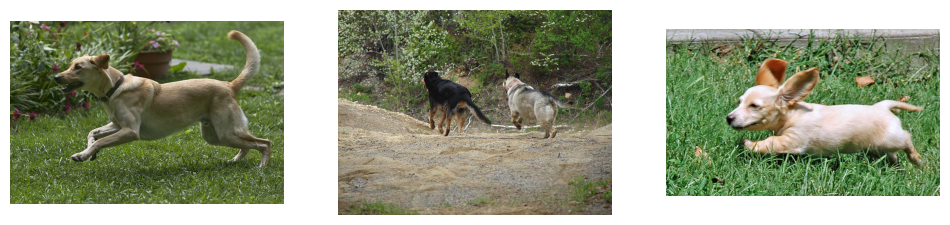

In [96]:
predict_end(10)

surfer ride wave clear blue ocean


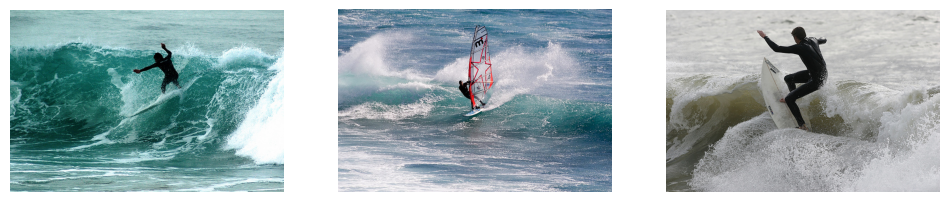

In [97]:
predict_end(53)

Итак при тесте на валидационной выборке мы видим, что при выдаче изображений модель попадает в запрос, но теряются детали. К примеру нужны были 2 щенка играющих в снегу, на что модель выдала несколько изображений на которых действительно присутствуют щенки(как минимум присутствуют собаки), даже играющие собаки, однако отсутствует снег. Например на следующем запросе нужны были три собаки, и в количество модель не попала, однако смогла распознать в запросе, что нужны именно собаки. И в третьем запросе модель справилась очень хорошо, распознала цифру 6 на собаке, и распознала, что собаки борзые, правильно выбрала желтый цвет и локацию на изображении. 

## Полносвязная нейронная сеть

In [98]:
X_nn = tf.cast(tf.reshape(X, (X.shape[0], X.shape[2])), dtype=np.float32)
Y_nn = tf.cast(tf.reshape(Y, (Y.shape[0], Y.shape[2])), dtype=np.float32)

In [99]:
X_nn_val = tf.cast(tf.reshape(X_valid, (X_valid.shape[0], X_valid.shape[2])), dtype=np.float32)
Y_nn_val = tf.cast(tf.reshape(y_valid, (y_valid.shape[0], y_valid.shape[2])), dtype=np.float32)

In [100]:
def create_model():
    model = Sequential()
    model.add(Dense(text_vector, activation='relu'))
    model.add(Dropout(.3))
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.3))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.3))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(.3))
    model.add(Dense(img_vector, activation='relu'))

    model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_squared_error'])
    return model

In [101]:
model_nn = create_model()

In [102]:
history = model_nn.fit(X_nn, Y_nn, 
          validation_data=(X_nn_val, Y_nn_val),
          batch_size=64, epochs=200,
          verbose=2, shuffle=True)

Epoch 1/200
14/14 - 3s - loss: 0.4948 - mean_squared_error: 0.8222 - val_loss: 0.4702 - val_mean_squared_error: 0.8327 - 3s/epoch - 188ms/step
Epoch 2/200
14/14 - 0s - loss: 0.4599 - mean_squared_error: 0.7263 - val_loss: 0.4716 - val_mean_squared_error: 0.8537 - 94ms/epoch - 7ms/step
Epoch 3/200
14/14 - 0s - loss: 0.4542 - mean_squared_error: 0.7128 - val_loss: 0.4582 - val_mean_squared_error: 0.7828 - 93ms/epoch - 7ms/step
Epoch 4/200
14/14 - 0s - loss: 0.4522 - mean_squared_error: 0.7045 - val_loss: 0.4640 - val_mean_squared_error: 0.8219 - 81ms/epoch - 6ms/step
Epoch 5/200
14/14 - 0s - loss: 0.4502 - mean_squared_error: 0.7009 - val_loss: 0.4592 - val_mean_squared_error: 0.7954 - 98ms/epoch - 7ms/step
Epoch 6/200
14/14 - 0s - loss: 0.4495 - mean_squared_error: 0.6982 - val_loss: 0.4565 - val_mean_squared_error: 0.7777 - 90ms/epoch - 6ms/step
Epoch 7/200
14/14 - 0s - loss: 0.4476 - mean_squared_error: 0.6927 - val_loss: 0.4566 - val_mean_squared_error: 0.7896 - 95ms/epoch - 7ms/step

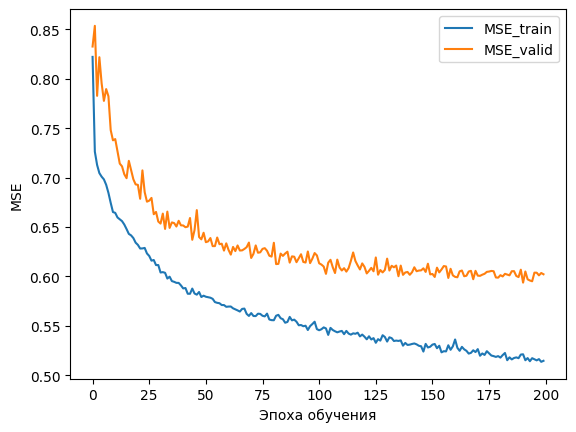

In [103]:
plt.plot(history.history['mean_squared_error'], 
         label='MSE_train')
plt.plot(history.history['val_mean_squared_error'], 
         label='MSE_valid')
plt.xlabel('Эпоха обучения')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [104]:
pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 11.2 MB/s eta 0:00:00


In [105]:
import optuna

In [106]:
# cтроим скелет сети
def base_model(learning_rate, p_1, n_2, p_2, n_3, p_3, n_4, p_4):
    model = Sequential()
    model.add(Dense(text_vector, activation='relu'))
    model.add(Dropout(p_1))
    model.add(Dense(n_2, activation='relu'))
    model.add(Dropout(p_2))
    model.add(Dense(n_3, activation='relu'))
    model.add(Dropout(p_3))
    model.add(Dense(n_4, activation='relu'))
    model.add(Dropout(p_4))
    model.add(Dense(img_vector, activation='relu'))

    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.Adam(learning_rate), metrics=['mean_squared_error'])
    return model

In [107]:
# функция для поиска нужных гиперпараметров
def objective(trial):
    
    #dropout
    p_1 = trial.suggest_float('module__p_1', 0.0, 0.5, step=0.1) 
    p_2 = trial.suggest_float('module__p_2', 0.0, 0.5, step=0.1) 
    p_3 = trial.suggest_float('module__p_3', 0.0, 0.5, step=0.1)
    p_4 = trial.suggest_float('module__p_4', 0.0, 0.5, step=0.1)
    
    #number of neuros
    n_2 = trial.suggest_int('module__n_2', 5, 2000,  step=10)
    n_3 = trial.suggest_int('module__n_3', 5, 2000,  step=10)
    n_4 = trial.suggest_int('module__n_4', 5, 2000,  step=10)
    
    #learning rate
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-0)
    
    #batch size 
    batch_size = trial.suggest_int('batch_size', 5, 120,  step=5)

    input_shape = (text_vector,)
    
    model_base = base_model(learning_rate, p_1, n_2, p_2, n_3, p_3, n_4, p_4)

    model_base.fit(
        X_nn,
        Y_nn,
        validation_data=(X_nn_val, Y_nn_val),
        shuffle=True,
        batch_size=batch_size,
        epochs=200,
        verbose=False,
    )

    # Evaluate the model MSE on the validation set.
    score = model_base.evaluate(X_nn_val, Y_nn_val, verbose=0)
    return score[1]


In [108]:
%%time
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20)

[I 2023-06-02 18:24:08,459] A new study created in memory with name: no-name-0fdeb572-9da9-4f7a-8777-17c3a58800a0
[I 2023-06-02 18:24:51,148] Trial 0 finished with value: 1.083985686302185 and parameters: {'module__p_1': 0.2, 'module__p_2': 0.4, 'module__p_3': 0.2, 'module__p_4': 0.0, 'module__n_2': 1285, 'module__n_3': 625, 'module__n_4': 1125, 'learning_rate': 0.06719182318196028, 'batch_size': 75}. Best is trial 0 with value: 1.083985686302185.
[I 2023-06-02 18:25:53,471] Trial 1 finished with value: 0.6873546242713928 and parameters: {'module__p_1': 0.30000000000000004, 'module__p_2': 0.5, 'module__p_3': 0.1, 'module__p_4': 0.5, 'module__n_2': 1775, 'module__n_3': 425, 'module__n_4': 1605, 'learning_rate': 0.0016844616432211302, 'batch_size': 15}. Best is trial 1 with value: 0.6873546242713928.
[I 2023-06-02 18:26:39,656] Trial 2 finished with value: 0.6847813129425049 and parameters: {'module__p_1': 0.1, 'module__p_2': 0.2, 'module__p_3': 0.1, 'module__p_4': 0.0, 'module__n_2': 87

CPU times: user 11min 56s, sys: 37.3 s, total: 12min 33s
Wall time: 12min 41s


In [109]:
optuna.visualization.plot_optimization_history(study)

In [110]:
optuna.visualization.plot_param_importances(study)

In [111]:
best_params = study.best_trial.params
best_params

{'module__p_1': 0.30000000000000004,
 'module__p_2': 0.2,
 'module__p_3': 0.0,
 'module__p_4': 0.0,
 'module__n_2': 1775,
 'module__n_3': 115,
 'module__n_4': 1365,
 'learning_rate': 5.1746022037323445e-05,
 'batch_size': 30}

In [112]:
best_model = base_model(best_params['learning_rate'], best_params['module__p_1'], 
                        best_params['module__n_2'], best_params['module__p_2'], best_params['module__n_3'], 
                        best_params['module__p_3'], best_params['module__n_4'], best_params['module__p_4'])

best_history = best_model.fit(
              X_nn,
              Y_nn,
              validation_data=(X_nn_val, Y_nn_val),
              shuffle=True,
              batch_size=best_params['batch_size'],
              epochs=200,
              verbose=2,
              )

Epoch 1/200
29/29 - 3s - loss: 0.5107 - mean_squared_error: 0.8869 - val_loss: 0.4889 - val_mean_squared_error: 0.8596 - 3s/epoch - 98ms/step
Epoch 2/200
29/29 - 0s - loss: 0.4727 - mean_squared_error: 0.7670 - val_loss: 0.4741 - val_mean_squared_error: 0.8145 - 290ms/epoch - 10ms/step
Epoch 3/200
29/29 - 0s - loss: 0.4660 - mean_squared_error: 0.7447 - val_loss: 0.4721 - val_mean_squared_error: 0.8022 - 425ms/epoch - 15ms/step
Epoch 4/200
29/29 - 0s - loss: 0.4643 - mean_squared_error: 0.7387 - val_loss: 0.4715 - val_mean_squared_error: 0.7988 - 358ms/epoch - 12ms/step
Epoch 5/200
29/29 - 0s - loss: 0.4638 - mean_squared_error: 0.7353 - val_loss: 0.4714 - val_mean_squared_error: 0.8023 - 428ms/epoch - 15ms/step
Epoch 6/200
29/29 - 0s - loss: 0.4635 - mean_squared_error: 0.7365 - val_loss: 0.4713 - val_mean_squared_error: 0.8043 - 341ms/epoch - 12ms/step
Epoch 7/200
29/29 - 0s - loss: 0.4630 - mean_squared_error: 0.7339 - val_loss: 0.4709 - val_mean_squared_error: 0.7999 - 303ms/epoch 

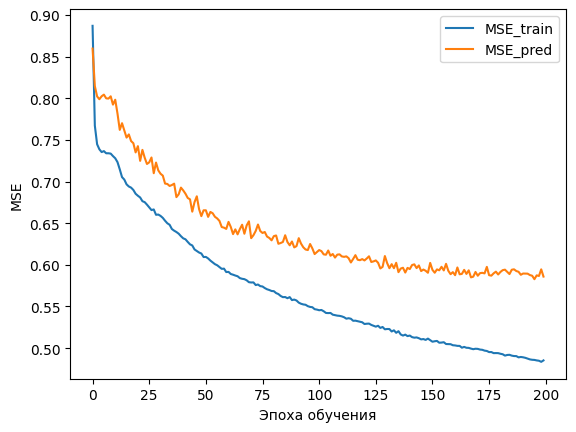

In [113]:
plt.plot(best_history.history['mean_squared_error'], 
         label='MSE_train')
plt.plot(best_history.history['val_mean_squared_error'], 
         label='MSE_pred')
plt.xlabel('Эпоха обучения')
plt.ylabel('MSE')
plt.legend()
plt.show()

Благодаря оптимизации сети через библиотеку Optuna мы смогли улучшить качество обучения сети и по метрике приблизились к линейной регрессии. Из этих 2 моделей для теста выбираем именно использование нейросети, поскольку хоть линейная регрессия и выдаёт более лучшую метрику, но требует большое количество ресурсов и обучается в разы медленнее.

In [114]:
def find_images_nn(text_vector, ind_vec, lim=3):
    ivec = best_model.predict(text_vector)
    df = pd.DataFrame(ind_vec)
    for i in df.index:
        df.loc[i, "distance"] = distance_of_vectors(ivec, df.loc[i, "img_vec"])
    return df.sort_values(by="distance")["image"].unique()[:lim]


def predict_nn(idx, df=y_val):
    qv = X_val.loc[idx, "text_vec"]
    qt = valid_df[valid_df["query_id"] == X_val.loc[idx, "query_id"]]["review_clean"].iloc[0]
    images = find_images_nn(qv, df)
    show_images(qt, images)

1/1 [==============================] - 0s 108ms/step
dog run deep snow


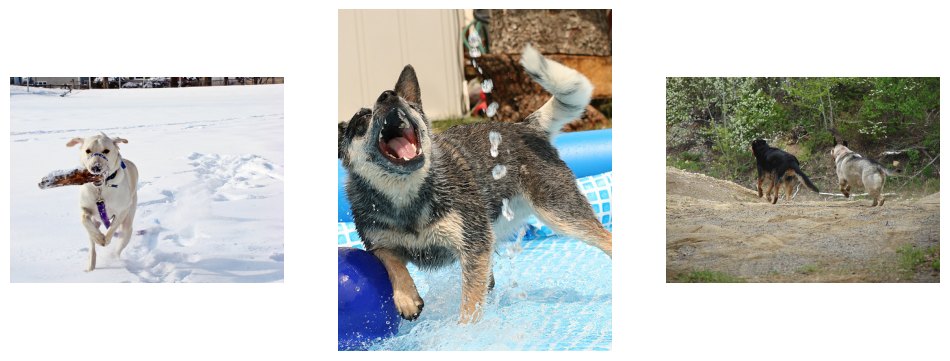

In [115]:
predict_nn(1)

1/1 [==============================] - 0s 27ms/step
dog roll grass


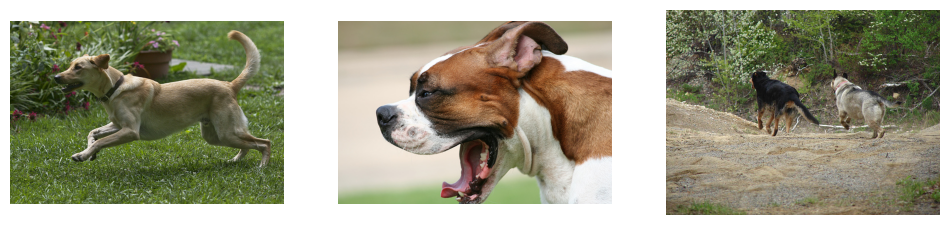

In [116]:
predict_nn(10)

1/1 [==============================] - 0s 32ms/step
surfer ride wave clear blue ocean


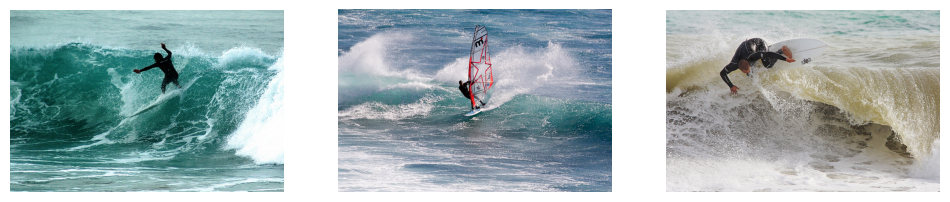

In [117]:
predict_nn(53)

## Вывод по результатам моделирования

Модель для тестирования - полносвязная нейронная сеть. Имеющая после оптимизации следующие гиперпараметры:

In [118]:
best_params

{'module__p_1': 0.30000000000000004,
 'module__p_2': 0.2,
 'module__p_3': 0.0,
 'module__p_4': 0.0,
 'module__n_2': 1775,
 'module__n_3': 115,
 'module__n_4': 1365,
 'learning_rate': 5.1746022037323445e-05,
 'batch_size': 30}

Где module__p_1-p_4 это значения дропаута, module__n_2-n_4 - значение нейронов по слоям. В целом результаты работы нейросети и линейной регрессии приблизительно одинаковые за легким перевесом линейной регрессии, однако в нейросеть куда более менее требовательна в ресурсах и куда более быстрее в работе.

# Тестирование модели

In [119]:
test_dataset["img_vec"] = test_dataset.apply(lambda x: tf.cast(vec_model(vector_image(x["image"], test_path)), dtype=np.float64), axis=1)

In [120]:
test_dataset.tail(30)

,query_id,image,review_clean,img_vec
470,862156271_3eacea90a8.jpg#0,862156271_3eacea90a8.jpg,girl orange hair stand street kind bottle hand,"((tf.Tensor(0.4281444549560547, shape=(), dtyp..."
471,862156271_3eacea90a8.jpg#1,862156271_3eacea90a8.jpg,two girl walk street,"((tf.Tensor(0.4281444549560547, shape=(), dtyp..."
472,862156271_3eacea90a8.jpg#2,862156271_3eacea90a8.jpg,two girl walk next talk,"((tf.Tensor(0.4281444549560547, shape=(), dtyp..."
473,862156271_3eacea90a8.jpg#3,862156271_3eacea90a8.jpg,two teenage girl dress like hippy walk talk,"((tf.Tensor(0.4281444549560547, shape=(), dtyp..."
474,862156271_3eacea90a8.jpg#4,862156271_3eacea90a8.jpg,two woman one head bandanna stand next one hol...,"((tf.Tensor(0.4281444549560547, shape=(), dtyp..."
475,862177617_c2c0581075.jpg#0,862177617_c2c0581075.jpg,girl wear blue wig brown hood jacket,"((tf.Tensor(0.6296390295028687, shape=(), dtyp..."
476,862177617_c2c0581075.jpg#1,862177617_c2c0581075.jpg,man wear interesting blue wig public,"((tf.Tensor(0.6296390295028687, shape=(), dtyp..."
477,862177617_c2c0581075.jpg#2,862177617_c2c0581075.jpg,person blue hair baseball cap hood stand outdo...,"((tf.Tensor(0.6296390295028687, shape=(), dtyp..."
478,862177617_c2c0581075.jpg#3,862177617_c2c0581075.jpg,man brown coat sunglass wear blue wig ball cap,"((tf.Tensor(0.6296390295028687, shape=(), dtyp..."
479,862177617_c2c0581075.jpg#4,862177617_c2c0581075.jpg,one person crowd people wear blue wig,"((tf.Tensor(0.6296390295028687, shape=(), dtyp..."


In [121]:
def text_vector_pred(query):
  tf_inputs = tokenizer_bert(query, padding=True, truncation=True, return_tensors="tf")
  tf_outputs = model_bert(tf_inputs)
  test_query = tf_outputs[0][:,0,:].numpy()
  test_fut = test_query.tolist()
  test_fut_tens = tf.convert_to_tensor(test_fut, dtype=np.float64)
  return test_fut_tens

In [122]:
def show_images_prod(query, images, top_distance, path=test_path):
    fig = plt.figure(figsize=(15, 15))
    print(query)
    for file in images:
      img = Image.open(join(path, file))
      plt.imshow(np.array(img))
      plt.xticks([])
      plt.xlabel(top_distance[0], fontsize=16, color = 'blue', loc = 'center', wrap=True)
      plt.yticks([])
      plt.tight_layout()

In [129]:
def pred_nn_test(user_query):
    if len(set(user_query.split()) & set(on_legal_protection_word)) > 0:
       return print(" image is unavailable in your country in compliance with local laws.")
    else:
      query = user_query
      vector_text = text_vector_pred(query) 
      pred = tf.convert_to_tensor(best_model.predict(vector_text), dtype=np.float64)
      for i in test_dataset.index:
        test_dataset.loc[i, "distance"] = distance_of_vectors(pred, test_dataset.loc[i, "img_vec"]) 
      images = test_dataset.sort_values(by="distance")["image"].unique()[:1]
      distance = test_dataset.sort_values(by="distance")["distance"].unique()[:1]
      show_images_prod(query, images, distance, test_path)

# Проверка работоспособности модели на практике

1/1 [==============================] - 0s 20ms/step
black dog dumbbell mouth


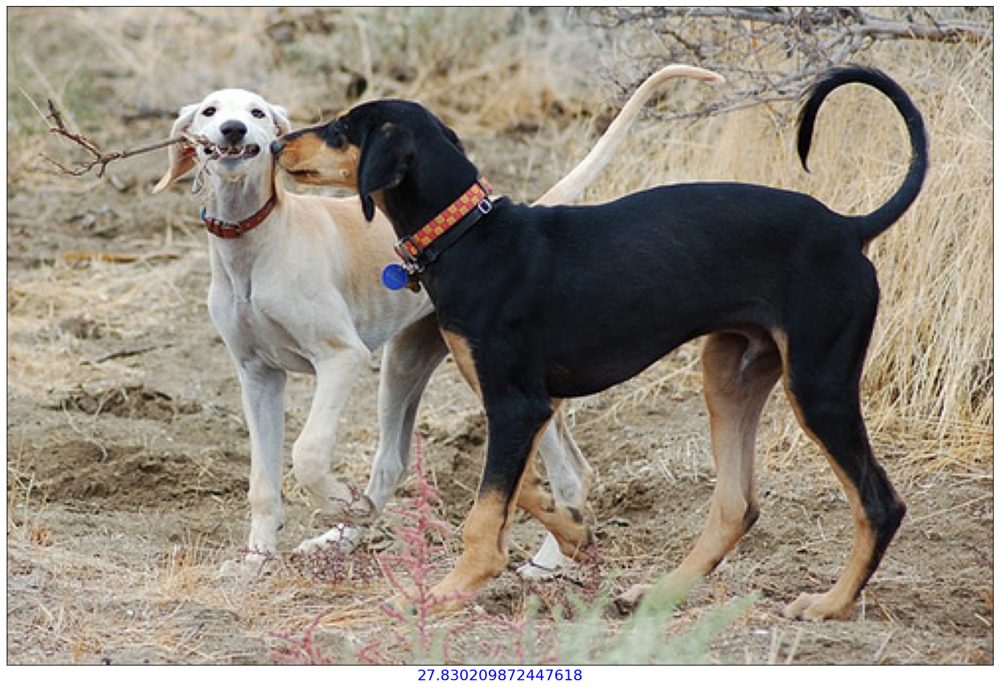

In [130]:
user_query_1 = 'black dog dumbbell mouth'
pred_nn_test(user_query_1)

In [131]:
user_query_2 = 'girl pool wear goggles surround child'
pred_nn_test(user_query_2)

 image is unavailable in your country in compliance with local laws.


1/1 [==============================] - 0s 18ms/step
dog sit side hill


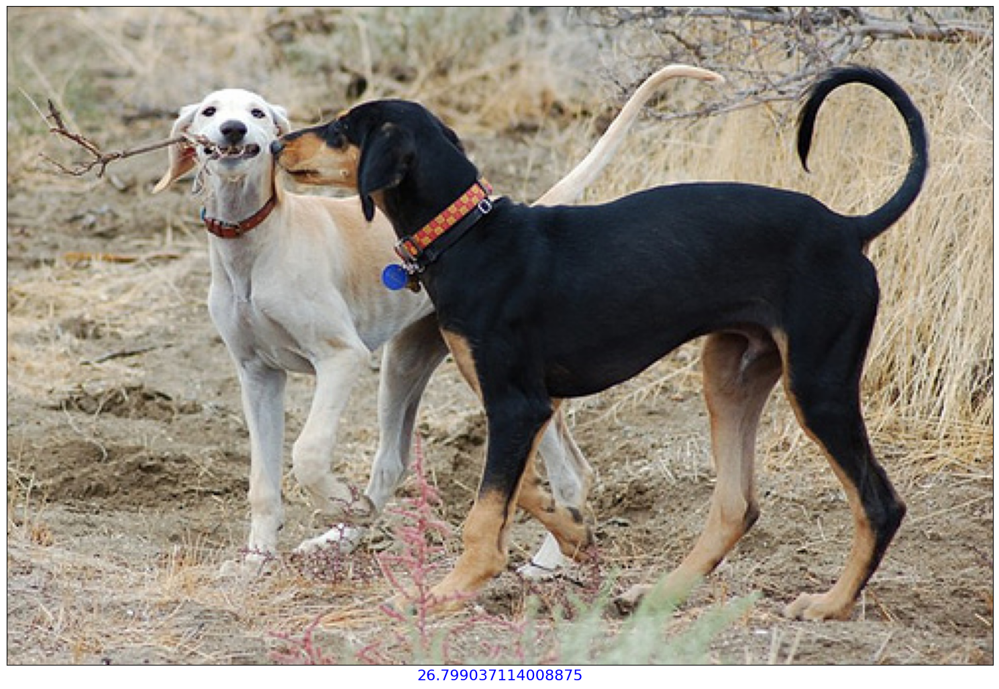

In [132]:
user_query_3 = 'dog sit side hill'
pred_nn_test(user_query_3)

1/1 [==============================] - 0s 19ms/step
woman play lacrosse


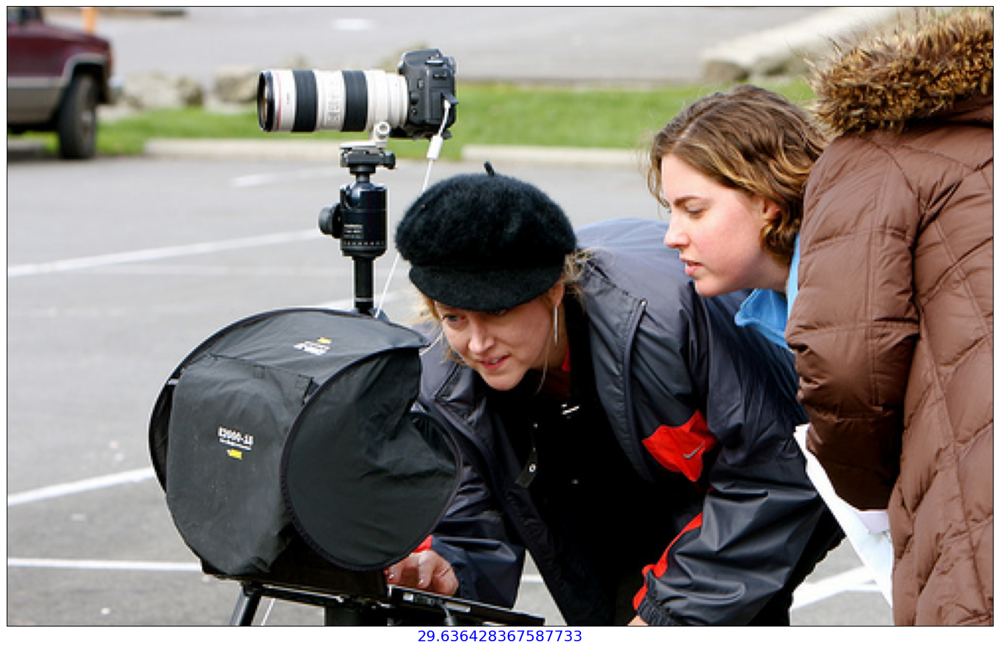

In [133]:
user_query_4 = 'woman play lacrosse'
pred_nn_test(user_query_4)

1/1 [==============================] - 0s 31ms/step
see and sun


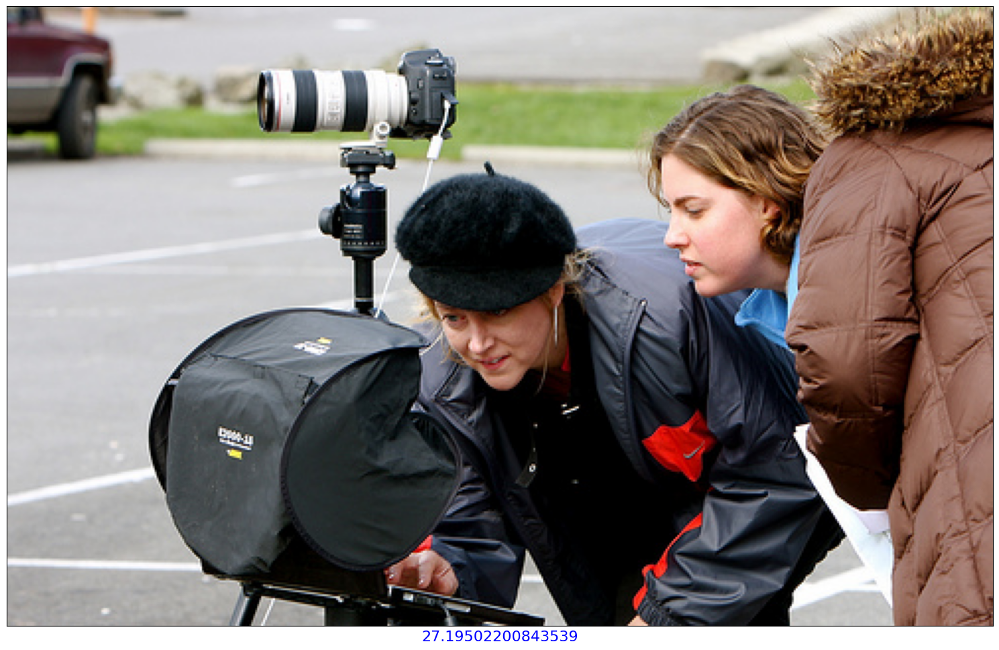

In [139]:
user_query_5 = 'see and sun'
pred_nn_test(user_query_5)

# Общий вывод

В результате проделанной работы нам удалось создать пробную версию модели для поиска изображений по введённому описанию. Которая выводит 3 самых близких к описанию по мнению модели изображения. Да, с некоторыми неточностями и несовпадениями, но увы и данные были представлены очень плохого качества и выделенные ресурсы не позволяют использовать большие мощности. Для улучшения данной модели можем увеличить выборку путём получения более качественных данных. Так же можно использовать BERT для обработки запросов, а вместо простой полносвязной сети использовать более глубокую сверточную сеть. В данной пробной версии используется модель полносвязной сети оптимизированной через библиотеку Optuna. Результат работы на тестовой выборке можно наблюдать выше. Эксперимент себя оправдал.